In [94]:
import torch as t
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, roc_auc_score
from torch.utils.data import TensorDataset, DataLoader
import seaborn as sns
import umap
import numpy as np
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import nnsight
from tqdm import tqdm
import sys
from nnsight import LanguageModel
from safetensors.torch import load_file
import os
from dictionary_learning.dictionary import AutoEncoderNew, AutoEncoder

os.environ["CUDA_VISIBLE_DEVICES"] = "1"

In [87]:
llm = LanguageModel("deepseek-ai/DeepSeek-R1-Distill-Qwen-1.5B", device_map="auto")
print(llm)

Qwen2ForCausalLM(
  (model): Qwen2Model(
    (embed_tokens): Embedding(151936, 1536)
    (layers): ModuleList(
      (0-27): 28 x Qwen2DecoderLayer(
        (self_attn): Qwen2Attention(
          (q_proj): Linear(in_features=1536, out_features=1536, bias=True)
          (k_proj): Linear(in_features=1536, out_features=256, bias=True)
          (v_proj): Linear(in_features=1536, out_features=256, bias=True)
          (o_proj): Linear(in_features=1536, out_features=1536, bias=False)
        )
        (mlp): Qwen2MLP(
          (gate_proj): Linear(in_features=1536, out_features=8960, bias=False)
          (up_proj): Linear(in_features=1536, out_features=8960, bias=False)
          (down_proj): Linear(in_features=8960, out_features=1536, bias=False)
          (act_fn): SiLU()
        )
        (input_layernorm): Qwen2RMSNorm((1536,), eps=1e-06)
        (post_attention_layernorm): Qwen2RMSNorm((1536,), eps=1e-06)
      )
    )
    (norm): Qwen2RMSNorm((1536,), eps=1e-06)
    (rotary_emb): Qw

In [3]:
def save_text_to_file(text: dict,
                      filename:str,
                      dir_path: str):
    
    os.makedirs(dir_path, exist_ok=True)  
    file_path = os.path.join(dir_path, filename)  
    with open(file_path, "w", encoding="utf-8") as file:
        file.write(text)
    print(f"File saved at: {file_path}")

In [4]:
def save_acts_to_file(hidden_states: dict,
                      filename: str,
                      dir_path: str):

    os.makedirs(dir_path, exist_ok=True)
    file_path = os.path.join(dir_path, filename)
    t.save(hidden_states, file_path)
    print(f"File saved at: {file_path}")
    

In [5]:
# def generate_output(llm: LanguageModel,
#                     prompt:str,
#                     append_eos_token: bool = True,
#                     n_new_tokens:int = 200,
#                     temperature: float = 1,
#                     print_ans: bool = True,
#                     save_ans: bool = False, 
#                     ans_filename: str = "ans.txt",
#                     ans_dir_path: str = "/home/aansh/nnsightusage/Logs/Check_4_Chinese_outputs/Answers",
#                     save_activations: bool = False,
#                     act_filename: str = "acts.pth",
#                     act_dir_path: str = "/home/aansh/nnsightusage/Logs/Check_4_Chinese_outputs/Activations"):
    
#     if append_eos_token:
#         prompt += llm.tokenizer.eos_token
    
#     with llm.generate(prompt, max_new_tokens=n_new_tokens, temperature=temperature) as tracer:
#         hidden_states = nnsight.dict().save()
#         for i in range(len(llm.model.layers)):
#             hidden_states[f"layer_{i}"] = {
#                 "mlp": [],
#                 "q_proj": [],
#                 "k_proj": [],
#             }
#         llm.model.layers.all()
#         for i in range(len(llm.model.layers)):
#             hidden_states[f"layer_{i}"]["mlp"].append(llm.model.layers[i].mlp.output.cpu())
#             hidden_states[f"layer_{i}"]["q_proj"].append(llm.model.layers[i].self_attn.q_proj.output.cpu())
#             hidden_states[f"layer_{i}"]["k_proj"].append(llm.model.layers[i].self_attn.k_proj.output.cpu())
#         out = llm.generator.output.cpu().save()
        
#     decoded_prompt = llm.tokenizer.decode(out[0][0:50])
#     decoded_answer = llm.tokenizer.decode(out[0][:])
    
#     if print_ans:
#         print(f"Prompt: {decoded_prompt}")
#         print(f"Generated Answer: {decoded_answer}")
        
#     if save_ans:
#         save_text_to_file(decoded_answer, ans_filename, ans_dir_path)
        
#     if save_activations:
#         save_acts_to_file(hidden_states, act_filename, act_dir_path)

In [14]:
prompt = """
Prove that the sum of first n odd natural numbers is equal to n^2.
"""

In [6]:
# for i in range(50, 200):
#     ans_filename = f"ans_run_{i+1}.txt"
#     act_filename = f"act_run_{i+1}.pth"
#     generate_output(llm, prompt, print_ans=False, save_ans=True, ans_filename=ans_filename, save_activations=True, act_filename=act_filename)

In [7]:
act_dir_path = "/home/aansh/nnsightusage/Logs/Check_4_Chinese_outputs/Activations"
ans_dir_path = "/home/aansh/nnsightusage/Logs/Check_4_Chinese_outputs/Answers"
act_files = os.listdir(act_dir_path)
ans_files = os.listdir(ans_dir_path)
act_files.sort()
ans_files.sort()

### Experiments
1) Think token probing: 
    - Checking for the "think" token and its corresponding activations and training a probe on the residual stream activations to classify "think" or not.
    - Doing the same by probing sae latents and comparing the results.
    - Can use these latents and activations to steer the model - as in just resample them in cases where the think token hasn't been used and rerun on the same answer and check. 

2) Chinese and "think" correlation
    - Check if there are common sae latents that fire for the "think" token and Chinese characters.
    - Also check for the attention that these characters give to the "think" token.
    - Can we make the model to think forcefully when not required and check if it randomly generates things (i.e weak hallucination) or reflect back and stops answering.

3) Run addition and subtraction examples saved from Perplexity's thread, and probe classifiers on the residual stream and sae latents to check for a particular concept in the model.   

## Experiment 1
- Training a probe on the mlp activations for position t, where position t+1 was the "think" token

In [8]:
def check_word_in_file(file_path: str, word: str) -> bool:
    with open(file_path, "r", encoding="utf-8") as file:
        text = file.read().strip()
    return word in text

count_num_thinks = 0
ans_think_filenames = []
for filename in ans_files:
    filePath = os.path.join(ans_dir_path, filename)
    if check_word_in_file(filePath, "</think>"):
        count_num_thinks += 1
        ans_think_filenames.append(filename)
        
print(count_num_thinks)
print(ans_think_filenames)

31
['ans_run_1.txt', 'ans_run_10.txt', 'ans_run_103.txt', 'ans_run_122.txt', 'ans_run_130.txt', 'ans_run_144.txt', 'ans_run_147.txt', 'ans_run_162.txt', 'ans_run_164.txt', 'ans_run_181.txt', 'ans_run_195.txt', 'ans_run_196.txt', 'ans_run_30.txt', 'ans_run_40.txt', 'ans_run_44.txt', 'ans_run_46.txt', 'ans_run_48.txt', 'ans_run_49.txt', 'ans_run_52.txt', 'ans_run_61.txt', 'ans_run_63.txt', 'ans_run_66.txt', 'ans_run_69.txt', 'ans_run_76.txt', 'ans_run_82.txt', 'ans_run_85.txt', 'ans_run_86.txt', 'ans_run_91.txt', 'ans_run_94.txt', 'ans_run_97.txt', 'ans_run_99.txt']


In [9]:
act_think_filenames = []
for ans_filename in ans_think_filenames:
    act_filename = ans_filename.replace("ans", "act")
    act_filename = act_filename.replace("txt", "pth")
    act_think_filenames.append(act_filename)
    
print(len(act_think_filenames))
print(act_think_filenames)

31
['act_run_1.pth', 'act_run_10.pth', 'act_run_103.pth', 'act_run_122.pth', 'act_run_130.pth', 'act_run_144.pth', 'act_run_147.pth', 'act_run_162.pth', 'act_run_164.pth', 'act_run_181.pth', 'act_run_195.pth', 'act_run_196.pth', 'act_run_30.pth', 'act_run_40.pth', 'act_run_44.pth', 'act_run_46.pth', 'act_run_48.pth', 'act_run_49.pth', 'act_run_52.pth', 'act_run_61.pth', 'act_run_63.pth', 'act_run_66.pth', 'act_run_69.pth', 'act_run_76.pth', 'act_run_82.pth', 'act_run_85.pth', 'act_run_86.pth', 'act_run_91.pth', 'act_run_94.pth', 'act_run_97.pth', 'act_run_99.pth']


In [10]:
def rearrange_activations_mlp(hidden_states: dict):
    ls_activations = []
    for i in range(len(hidden_states)):
        first_token_acts = hidden_states[f"layer_{i}"]["mlp"][0]
        rest_token_acts = t.cat(hidden_states[f"layer_{i}"]["mlp"][1:], dim=1)
        all_acts = t.cat([first_token_acts, rest_token_acts], dim=1)
        ls_activations.append(all_acts)
    
    return t.cat(ls_activations, dim=0)

In [ ]:
def get_think_token_position(ans_dir_path: str, ans_filename: str) -> int:
    ans_file_path = os.path.join(ans_dir_path, ans_filename)
    with open(ans_file_path, "r", encoding="utf-8") as file:
        text = file.read().strip()
    tokenized_text_ids = llm.tokenizer(text, return_tensors="pt", add_special_tokens=False)
    tokenized_text = llm.tokenizer.tokenize(text)
    think_token = "</think>"
    think_token_index = tokenized_text.index(think_token)
    return tokenized_text_ids, tokenized_text, think_token_index     

def get_think_token_mlp_activations(act_dir_path: str, act_filename: str) -> t.Tensor:
    act_file_path = os.path.join(act_dir_path, act_filename)
    hidden_states = t.load(act_file_path)
    return rearrange_activations_mlp(hidden_states)

In [63]:
ls_think_token_activations = []
for i, act_filename in tqdm(enumerate(act_think_filenames)):
    act_file_path = os.path.join(act_dir_path, act_filename)
    hidden_states = t.load(act_file_path)
    ans_filename = act_filename.replace("act", "ans")
    ans_filename = ans_filename.replace("pth", "txt")
    tokenized_text_ids, tokenized_text, think_token_index = get_think_token_position(ans_dir_path, ans_filename)
    mlp_activations = get_think_token_mlp_activations(act_dir_path, act_filename)
    think_token_mlp_activations = mlp_activations[:, think_token_index-1, :].unsqueeze(0)
    ls_think_token_activations.append(think_token_mlp_activations)
    
think_token_activations = t.cat(ls_think_token_activations, dim=0)

31it [02:26,  4.74s/it]


In [64]:
think_token_activations.shape

torch.Size([31, 28, 1536])

In [74]:
ls_non_think_token_activations = []
for i, act_filename in tqdm(enumerate(act_files)):
    if act_filename in act_think_filenames:
        continue
    hidden_states = t.load(act_file_path)
    token_index = t.randint(0, 200, (1, 1)).item()
    mlp_activations = get_think_token_mlp_activations(act_dir_path, act_filename)
    non_think_token_mlp_activations = mlp_activations[:, token_index, :].unsqueeze(0)
    ls_non_think_token_activations.append(non_think_token_mlp_activations)
   
non_think_token_activations = t.cat(ls_non_think_token_activations, dim=0) 

200it [13:29,  4.05s/it]


In [75]:
non_think_token_activations.shape

torch.Size([169, 28, 1536])

100%|██████████| 10/10 [00:20<00:00,  2.09s/it]


Text(0.5, 1.0, 'Classifier Accuracy for Each Layer')

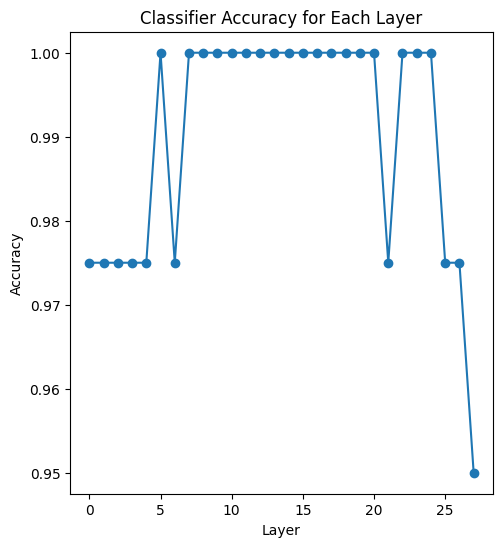

In [109]:
def train_classifier(X_train, y_train, X_test, y_test, epochs=10, batch_size=16):
    model = nn.Sequential(
        nn.Linear(X_train.shape[1], 50),
        nn.ReLU(),
        nn.Linear(50, 2)  # 2 classes
    )
    model.to("cuda")
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    
    train_dataset = TensorDataset(t.tensor(X_train, dtype=t.float32), t.tensor(y_train, dtype=t.long))
    test_dataset = TensorDataset(t.tensor(X_test, dtype=t.float32), t.tensor(y_test, dtype=t.long))
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size)
    
    for epoch in tqdm(range(epochs)):
        model.train()
        for X_batch, y_batch in train_loader:
            X_batch = X_batch.to("cuda")
            y_batch = y_batch.to("cuda")
            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()
    
    model.eval()
    correct, total = 0, 0
    with t.no_grad():
        for X_batch, y_batch in test_loader:
            X_batch = X_batch.to("cuda")
            y_batch = y_batch.to("cuda")
            outputs = model(X_batch)
            _, predicted = t.max(outputs, 1)
            total += y_batch.size(0)
            correct += (predicted == y_batch).sum().item()
    
    return correct / total  # Return accuracy

# Load Data
class1 = think_token_activations # Example class 1 embeddings
class2 = non_think_token_activations  # Example class 2 embeddings

y1 = t.zeros(31)  # Labels for class 1
y2 = t.ones(169)  # Labels for class 2

y = t.cat((y1, y2)).numpy()
accuracies = []

# Train classifier for each layer
for layer in range(28):
    X = t.cat((class1[:, layer, :], class2[:, layer, :]), dim=0).numpy()
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    
    acc = train_classifier(X_train, y_train, X_test, y_test)
    accuracies.append(acc)

# Train classifier on all layers combined
X_combined = t.cat((class1, class2)).numpy().reshape(-1, 28 * 1536)
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
combined_acc = train_classifier(X_train, y_train, X_test, y_test)

# Plot results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(range(28), accuracies, marker='o')
plt.xlabel("Layer")
plt.ylabel("Accuracy")
plt.title("Classifier Accuracy for Each Layer")

100%|██████████| 20/20 [00:41<00:00,  2.07s/it]


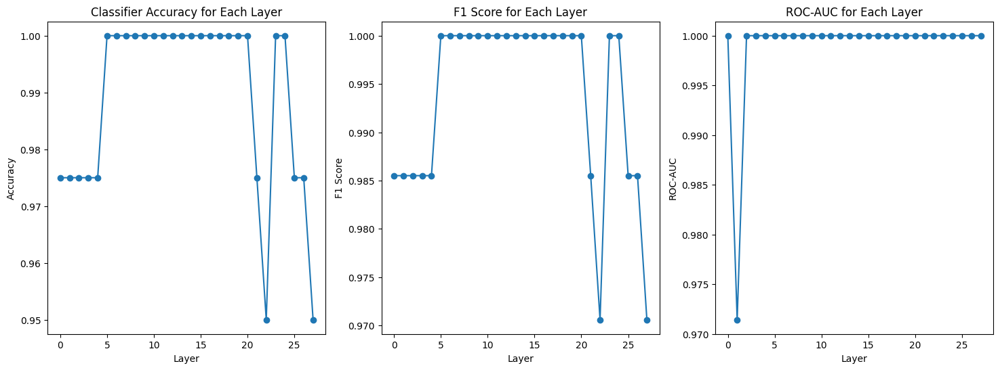

In [112]:
def train_classifier(X_train, y_train, X_test, y_test, epochs=20, batch_size=16):
    model = nn.Sequential(
        nn.Linear(X_train.shape[1], 50),
        nn.ReLU(),
        nn.Linear(50, 2)  # 2 classes
    )
    model.to("cuda")
    
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    
    train_dataset = TensorDataset(t.tensor(X_train, dtype=t.float32), t.tensor(y_train, dtype=t.long))
    test_dataset = TensorDataset(t.tensor(X_test, dtype=t.float32), t.tensor(y_test, dtype=t.long))
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size)
    
    for epoch in tqdm(range(epochs)):
        model.train()
        for X_batch, y_batch in train_loader:
            X_batch = X_batch.to("cuda")
            y_batch = y_batch.to("cuda")
            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()
    
    model.eval()
    correct, total = 0, 0
    y_true, y_pred, y_scores = [], [], []
    with t.no_grad():
        for X_batch, y_batch in test_loader:
            X_batch = X_batch.to("cuda")
            y_batch = y_batch.to("cuda")
            outputs = model(X_batch)
            _, predicted = t.max(outputs, 1)
            y_true.extend(y_batch.cpu().numpy())
            y_pred.extend(predicted.cpu().numpy())
            y_scores.extend(t.softmax(outputs, dim=1)[:, 1].cpu().numpy())
            total += y_batch.size(0)
            correct += (predicted == y_batch).sum().item()
    
    accuracy = correct / total
    f1 = f1_score(y_true, y_pred)
    roc_auc = roc_auc_score(y_true, y_scores)
    
    return accuracy, f1, roc_auc

# Load Data
class1 = think_token_activations  # Example class 1 embeddings
class2 = non_think_token_activations  # Example class 2 embeddings

y1 = t.zeros(31)  # Labels for class 1
y2 = t.ones(169)  # Labels for class 2

y = t.cat((y1, y2)).numpy()
accuracies, f1_scores, roc_aucs = [], [], []

# Train classifier for each layer
for layer in range(28):
    X = t.cat((class1[:, layer, :], class2[:, layer, :])).numpy()
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    
    acc, f1, roc_auc = train_classifier(X_train, y_train, X_test, y_test)
    accuracies.append(acc)
    f1_scores.append(f1)
    roc_aucs.append(roc_auc)

# Train classifier on all layers combined
X_combined = t.cat((class1, class2)).numpy().reshape(-1, 28 * 1536)
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
combined_acc, combined_f1, combined_roc_auc = train_classifier(X_train, y_train, X_test, y_test)

# Plot results
plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.plot(range(28), accuracies, marker='o')
plt.xlabel("Layer")
plt.ylabel("Accuracy")
plt.title("Classifier Accuracy for Each Layer")

plt.subplot(1, 3, 2)
plt.plot(range(28), f1_scores, marker='o')
plt.xlabel("Layer")
plt.ylabel("F1 Score")
plt.title("F1 Score for Each Layer")

plt.subplot(1, 3, 3)
plt.plot(range(28), roc_aucs, marker='o')
plt.xlabel("Layer")
plt.ylabel("ROC-AUC")
plt.title("ROC-AUC for Each Layer")

plt.show()


/home/aansh/nnsightusage/nns2env/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/home/aansh/nnsightusage/nns2env/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/home/aansh/nnsightusage/nns2env/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/home/aansh/nnsightusage/nns2env/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/home/aansh/nnsightusage/nns2env/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/home/aansh/nnsightusage/nns2e

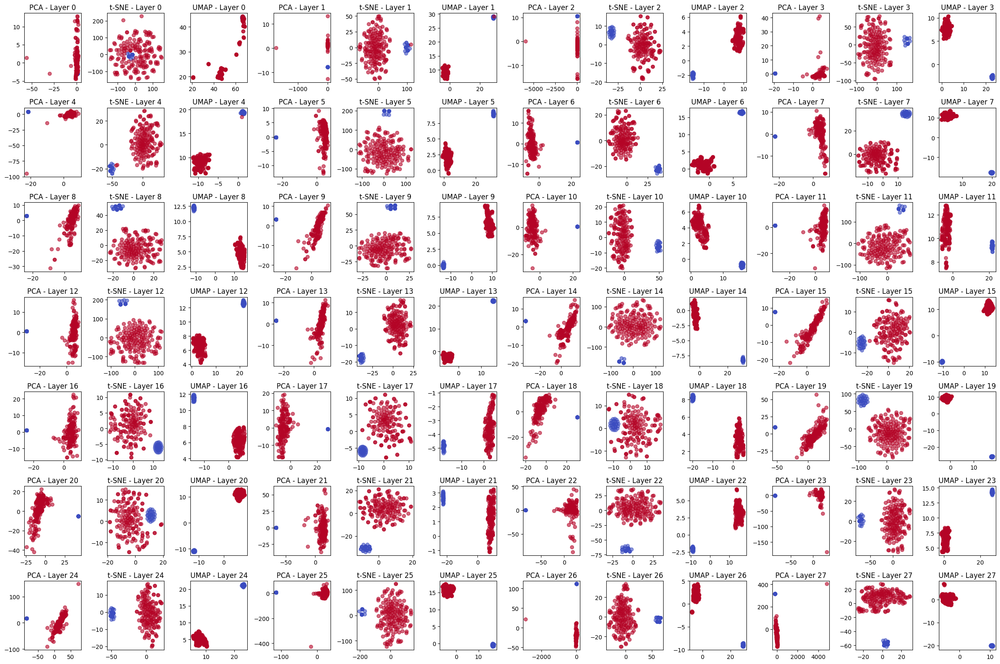

In [122]:
fig, axes = plt.subplots(7, 12, figsize=(24, 16))
for layer in range(28):
    X = t.cat((class1[:, layer, :], class2[:, layer, :])).numpy()
    labels = y
    
    pca = PCA(n_components=2).fit_transform(X)
    tsne = TSNE(n_components=2, random_state=42).fit_transform(X)
    umap_proj = umap.UMAP(n_components=2, random_state=42).fit_transform(X)
    
    row = layer // 4
    col = (layer % 4) * 3
    
    axes[row, col].scatter(pca[:, 0], pca[:, 1], c=labels, cmap='coolwarm', alpha=0.6)
    axes[row, col].set_title(f'PCA - Layer {layer}')
    
    axes[row, col + 1].scatter(tsne[:, 0], tsne[:, 1], c=labels, cmap='coolwarm', alpha=0.6)
    axes[row, col + 1].set_title(f't-SNE - Layer {layer}')
    
    axes[row, col + 2].scatter(umap_proj[:, 0], umap_proj[:, 1], c=labels, cmap='coolwarm', alpha=0.6)
    axes[row, col + 2].set_title(f'UMAP - Layer {layer}')
    
plt.tight_layout()
plt.show()

In [120]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Create subplots
fig = make_subplots(rows=1, cols=3, subplot_titles=("PCA", "t-SNE", "UMAP"))

# Add traces for each layer
for layer in range(28):
    pca = PCA(n_components=2).fit_transform(t.cat((class1[:, layer, :], class2[:, layer, :])).numpy())
    tsne = TSNE(n_components=2, random_state=42).fit_transform(t.cat((class1[:, layer, :], class2[:, layer, :])).numpy())
    umap_proj = umap.UMAP(n_components=2, random_state=42).fit_transform(t.cat((class1[:, layer, :], class2[:, layer, :])).numpy())
    
    fig.add_trace(go.Scatter(x=pca[:, 0], y=pca[:, 1], mode='markers', marker=dict(color=y), name=f'Layer {layer} PCA'), row=1, col=1)
    fig.add_trace(go.Scatter(x=tsne[:, 0], y=tsne[:, 1], mode='markers', marker=dict(color=y), name=f'Layer {layer} t-SNE'), row=1, col=2)
    fig.add_trace(go.Scatter(x=umap_proj[:, 0], y=umap_proj[:, 1], mode='markers', marker=dict(color=y), name=f'Layer {layer} UMAP'), row=1, col=3)

# Update layout with dropdown
fig.update_layout(
    updatemenus=[
        dict(
            buttons=[
                dict(label=f'Layer {layer}',
                     method='update',
                     args=[{'visible': [i // 3 == layer for i in range(28 * 3)]},
                           {'title': f'Layer {layer}'}])
                for layer in range(28)
            ],
            direction="down",
            showactive=True,
        )
    ]
)

# Set initial visibility
for i in range(28 * 3):
    fig.data[i].visible = i // 3 == 0

fig.show()

/home/aansh/nnsightusage/nns2env/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/home/aansh/nnsightusage/nns2env/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/home/aansh/nnsightusage/nns2env/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/home/aansh/nnsightusage/nns2env/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/home/aansh/nnsightusage/nns2env/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/home/aansh/nnsightusage/nns2e